In [1]:
import os
import numpy as np
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt


import torchvision
from torchvision import datasets,transforms
from torchvision.transforms.functional import to_pil_image

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, ConcatDataset

## Preparing dataset

In [8]:
class CustomDataset(Dataset):
    def __init__(self, root_dir, transform=None, num_samples=25000):
        self.root_dir = root_dir
        self.transform = transform
        all_images = [os.path.join(root_dir, f) for f in os.listdir(root_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
        if len(all_images) < num_samples:
            raise ValueError(f"Number of available images ({len(all_images)}) is less than the requested num_samples ({num_samples}).")
        self.images = np.random.choice(all_images, num_samples, replace=False)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    #transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
])

dataset = CustomDataset(root_dir="/kaggle/input/animefacedataset/images", transform=transform)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True, num_workers=4)

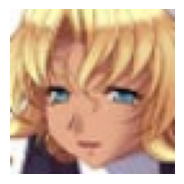

In [9]:
data_iter = iter(dataloader)
images = next(data_iter)
plt.figure(figsize=(20, 20))
for i in range(len(images)):
    plt.subplot(4, 8, i + 1)
    denormalized_image = images[i].numpy()
    denormalized_image = np.clip(denormalized_image, 0, 1)
    plt.imshow(np.transpose(denormalized_image, (1, 2, 0)))
    plt.axis('off')
    break

plt.show()

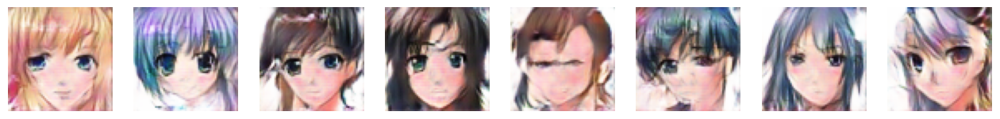

In [28]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # Ensure we use the right device

plt.figure(figsize=(16, 2))  # Adjusted to make images fit in 1 row with larger size

num_images = 8  # Number of images in a row
latent_dim = 300  # Latent space dimension

# Ensure the generator is on the right device
dcgan.generator.to(device)
dcgan.generator.eval()

for i in range(num_images):
    plt.subplot(1, num_images, i + 1)  # 1 row, 8 images

    noise = torch.randn(1, latent_dim, device=device)  # Move noise tensor to the correct device
    
    with torch.no_grad():
        generated_image = dcgan.generator(noise)

    generated_image = generated_image.squeeze().cpu().detach()  # Move image to CPU after generation
    generated_image = (generated_image*1) * 255
    
    image = Image.fromarray(np.uint8(generated_image.permute(1, 2, 0).numpy()))
    
    plt.imshow(image)
    plt.axis('off')

plt.show()


## Building and training model (GAN)

In [10]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchmetrics import MeanMetric  
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

class GeneratorModel(nn.Module):
    def __init__(self, input_dim=300):
        super(GeneratorModel, self).__init__()
        
        self.fc = nn.Sequential(
            nn.Linear(input_dim, 8 * 8 * 512), 
            nn.ReLU()
        )
        
        self.conv_layers = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),  
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),   
            nn.ReLU(),
            nn.Conv2d(64, 3, kernel_size=4, padding=1),                        
            nn.Sigmoid() 
        )
        
        self.apply(self._initialize_weights)
    
    def _initialize_weights(self, m):
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.Linear)):
            nn.init.normal_(m.weight, mean=0.0, std=0.02)  
            if m.bias is not None:
                nn.init.constant_(m.bias, 0)
    
    def forward(self, x):
        x = self.fc(x) 
        x = x.view(-1, 512, 8, 8) 
        x = self.conv_layers(x)  
        return x

# Define the Discriminator model
class DiscriminatorModel(nn.Module):
    def __init__(self, input_shape=(3, 64, 64)):
        super(DiscriminatorModel, self).__init__()

        # Define layers
        self.conv_layers = nn.Sequential(
            nn.Conv2d(input_shape[0], 64, kernel_size=3),    
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(kernel_size=2, stride=2),           

            nn.Conv2d(64, 128, kernel_size=3),               
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(128, 256, kernel_size=3),              
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        # Fully connected layers
        self.fc_layers = nn.Sequential(
            nn.Flatten(),                                 
            nn.Linear(256 * 6 * 6, 256),                    
            nn.LeakyReLU(0.2),
            nn.Linear(256, 1),                             
            nn.Sigmoid()                                 
        )

        # Initialize weights
        self.apply(self._initialize_weights)

    def _initialize_weights(self, m):
        if isinstance(m, (nn.Conv2d, nn.Linear)):
            nn.init.normal_(m.weight, mean=0.0, std=0.02)
            if m.bias is not None:
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        x = self.conv_layers(x)  
        x = self.fc_layers(x)    
        return x

# Define the DCGAN class
class DCGAN(nn.Module):
    def __init__(self, generator, discriminator, latent_dim=300):
        super(DCGAN, self).__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim
        
        # Track loss metrics
        self.g_loss_metric = MeanMetric()
        self.d_loss_metric = MeanMetric()
    
    def compile(self, g_optimizer, d_optimizer, loss_fn):
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer
        self.loss_fn = loss_fn
    
    def train_step(self, real_images):
        batch_size = real_images.size(0)
        
        # Generate random noise
        random_noise = torch.randn(batch_size, self.latent_dim, device=real_images.device)
        
        
        self.discriminator.train()
        self.generator.eval()  
        real_labels = torch.ones(batch_size, 1, device=real_images.device) * 0.95  
        pred_real = self.discriminator(real_images)
        d_loss_real = self.loss_fn(pred_real, real_labels)
        
        fake_images = self.generator(random_noise).detach()  
        fake_labels = torch.zeros(batch_size, 1, device=real_images.device)
        pred_fake = self.discriminator(fake_images)
        d_loss_fake = self.loss_fn(pred_fake, fake_labels)
        
        d_loss = (d_loss_real + d_loss_fake) / 2
        
        # Backpropagation and optimization for discriminator
        self.d_optimizer.zero_grad()
        d_loss.backward()
        self.d_optimizer.step()
        
        self.generator.train()
        labels = torch.ones(batch_size, 1, device=real_images.device)
        fake_images = self.generator(random_noise)
        pred_fake = self.discriminator(fake_images)
        g_loss = self.loss_fn(pred_fake, labels)
        
        # Backpropagation and optimization for generator
        self.g_optimizer.zero_grad()
        g_loss.backward()
        self.g_optimizer.step()
        
        self.d_loss_metric.update(d_loss.item())
        self.g_loss_metric.update(g_loss.item())
        
        return {'d_loss': self.d_loss_metric.compute(), 'g_loss': self.g_loss_metric.compute()}

generator = GeneratorModel().to(device)
discriminator = DiscriminatorModel().to(device)
dcgan = DCGAN(generator, discriminator, latent_dim=300)

dcgan.compile(
    g_optimizer=optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999)),
    d_optimizer=optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999)),
    loss_fn=nn.BCELoss()
)

transform = transforms.Compose([
    transforms.Resize(64),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize to [-1, 1]
])


# Training loop
epochs = 5
for epoch in range(epochs):
    dcgan.generator.train()
    dcgan.discriminator.train()
    
    d_loss_total = 0.0
    g_loss_total = 0.0
    
    for real_images in tqdm(dataloader, desc=f'Epoch {epoch + 1}/{epochs}'):
        real_images = real_images.to(device)  # Move real images to CUDA
        
        losses = dcgan.train_step(real_images)
        d_loss_total += losses['d_loss']
        g_loss_total += losses['g_loss']
    
    print(f"Epoch [{epoch+1}/{epochs}] - D Loss: {d_loss_total / len(dataloader)}, G Loss: {g_loss_total / len(dataloader)}")

torch.save(dcgan.generator.state_dict(), 'generator.pth')
torch.save(dcgan.discriminator.state_dict(), 'discriminator.pth')


Using device: cuda


Epoch 1/5: 100%|██████████| 782/782 [00:39<00:00, 19.95it/s]


Epoch [1/5] - D Loss: 0.5106390714645386, G Loss: 1.4721709489822388


Epoch 2/5: 100%|██████████| 782/782 [00:38<00:00, 20.19it/s]


Epoch [2/5] - D Loss: 0.5524643063545227, G Loss: 1.3930357694625854


Epoch 3/5: 100%|██████████| 782/782 [00:38<00:00, 20.18it/s]


Epoch [3/5] - D Loss: 0.5410929322242737, G Loss: 1.4609540700912476


Epoch 4/5: 100%|██████████| 782/782 [00:38<00:00, 20.27it/s]


Epoch [4/5] - D Loss: 0.5223820805549622, G Loss: 1.5652687549591064


Epoch 5/5: 100%|██████████| 782/782 [00:38<00:00, 20.27it/s]


Epoch [5/5] - D Loss: 0.5108761787414551, G Loss: 1.633912205696106


Epoch 6/50: 100%|██████████| 782/782 [00:38<00:00, 20.27it/s]


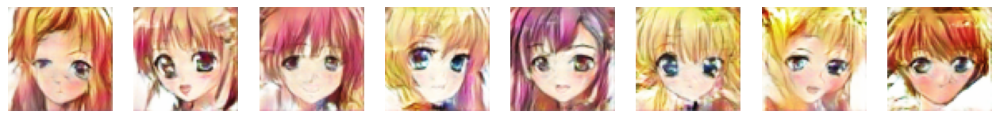

Epoch [6/50] - D Loss: 0.46154510974884033, G Loss: 1.876845121383667


Epoch 7/50: 100%|██████████| 782/782 [00:38<00:00, 20.36it/s]


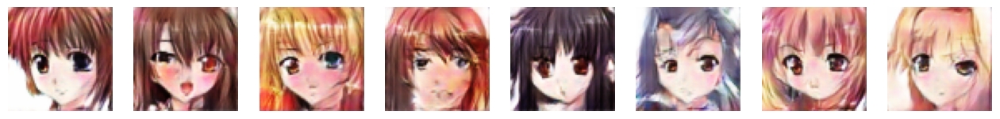

Epoch [7/50] - D Loss: 0.4554150402545929, G Loss: 1.9109970331192017


Epoch 8/50: 100%|██████████| 782/782 [00:38<00:00, 20.25it/s]


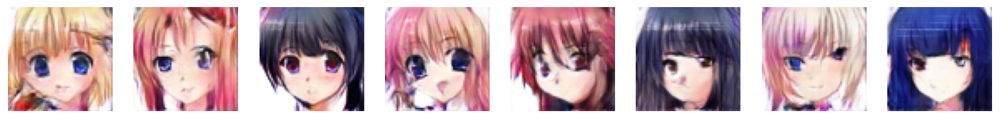

Epoch [8/50] - D Loss: 0.44949859380722046, G Loss: 1.9446295499801636


Epoch 9/50: 100%|██████████| 782/782 [00:38<00:00, 20.10it/s]


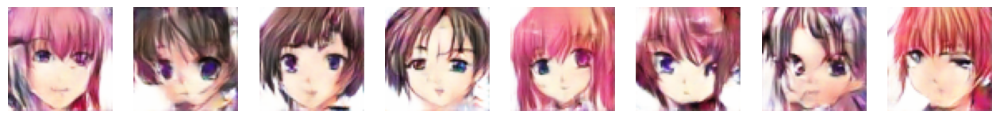

Epoch [9/50] - D Loss: 0.44407984614372253, G Loss: 1.9782462120056152


Epoch 10/50: 100%|██████████| 782/782 [00:38<00:00, 20.08it/s]


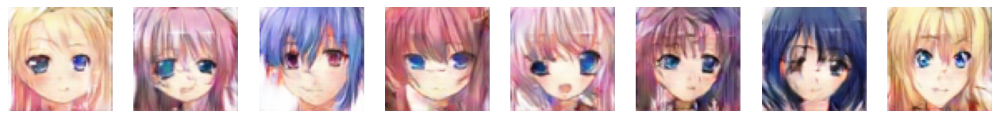

Epoch [10/50] - D Loss: 0.4386187195777893, G Loss: 2.0128941535949707


Epoch 11/50: 100%|██████████| 782/782 [00:38<00:00, 20.19it/s]


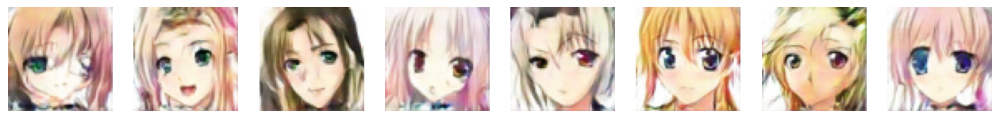

Epoch [11/50] - D Loss: 0.4335629940032959, G Loss: 2.0462887287139893


Epoch 12/50: 100%|██████████| 782/782 [00:38<00:00, 20.20it/s]


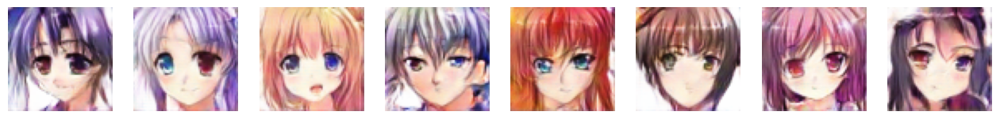

Epoch [12/50] - D Loss: 0.42904314398765564, G Loss: 2.0763864517211914


Epoch 13/50: 100%|██████████| 782/782 [00:39<00:00, 20.04it/s]


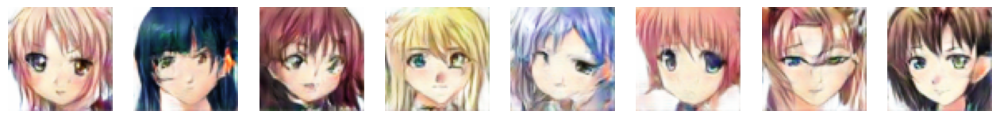

Epoch [13/50] - D Loss: 0.4245139956474304, G Loss: 2.1068081855773926


Epoch 14/50: 100%|██████████| 782/782 [00:38<00:00, 20.13it/s]


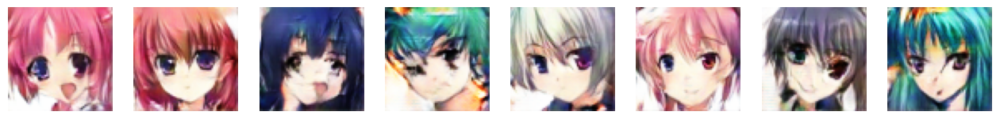

Epoch [14/50] - D Loss: 0.42018648982048035, G Loss: 2.137284517288208


Epoch 15/50: 100%|██████████| 782/782 [00:38<00:00, 20.07it/s]


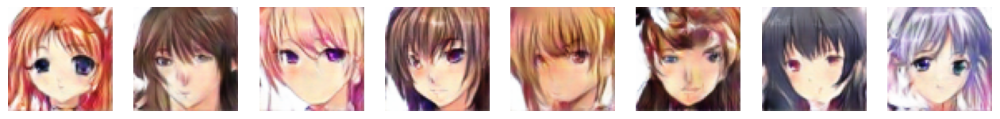

Epoch [15/50] - D Loss: 0.41597139835357666, G Loss: 2.167661428451538


Epoch 16/50: 100%|██████████| 782/782 [00:38<00:00, 20.09it/s]


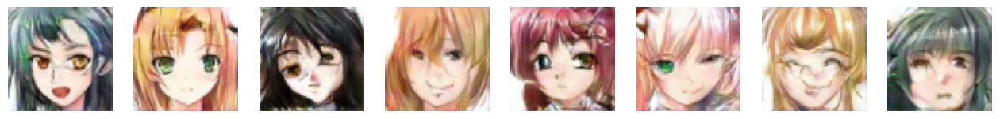

Epoch [16/50] - D Loss: 0.41178828477859497, G Loss: 2.1985666751861572


Epoch 17/50: 100%|██████████| 782/782 [00:38<00:00, 20.21it/s]


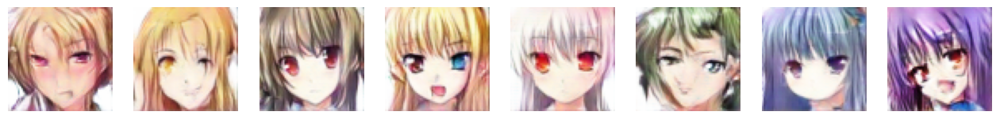

Epoch [17/50] - D Loss: 0.40778058767318726, G Loss: 2.2294299602508545


Epoch 18/50: 100%|██████████| 782/782 [00:38<00:00, 20.34it/s]


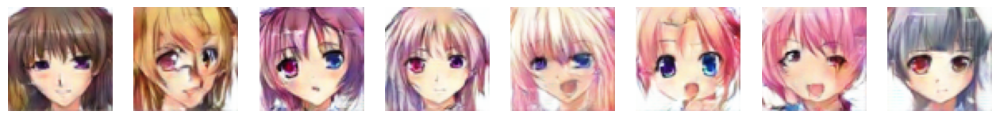

Epoch [18/50] - D Loss: 0.40368303656578064, G Loss: 2.261979103088379


Epoch 19/50: 100%|██████████| 782/782 [00:38<00:00, 20.33it/s]


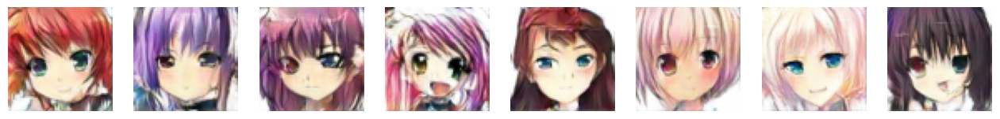

Epoch [19/50] - D Loss: 0.39975565671920776, G Loss: 2.29475474357605


Epoch 20/50: 100%|██████████| 782/782 [00:38<00:00, 20.06it/s]


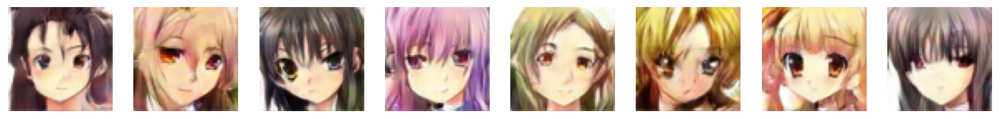

Epoch [20/50] - D Loss: 0.3958906829357147, G Loss: 2.3269217014312744


Epoch 21/50: 100%|██████████| 782/782 [00:38<00:00, 20.13it/s]


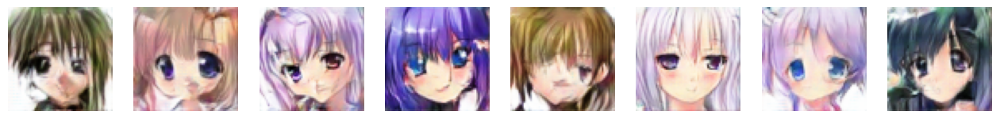

Epoch [21/50] - D Loss: 0.39201784133911133, G Loss: 2.360400676727295


Epoch 22/50: 100%|██████████| 782/782 [00:38<00:00, 20.27it/s]


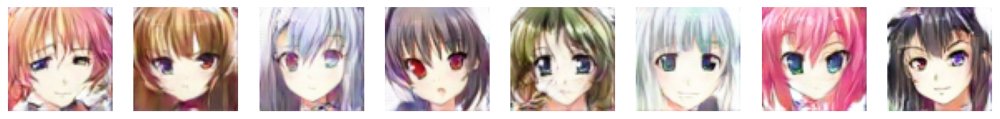

Epoch [22/50] - D Loss: 0.3882295787334442, G Loss: 2.3933675289154053


Epoch 23/50: 100%|██████████| 782/782 [00:38<00:00, 20.40it/s]


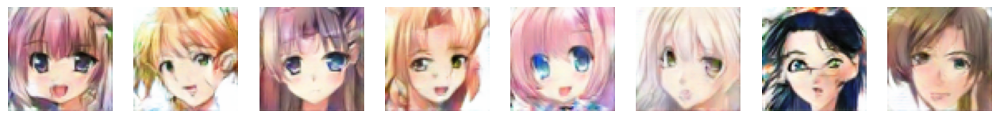

Epoch [23/50] - D Loss: 0.3845694959163666, G Loss: 2.4270129203796387


Epoch 24/50: 100%|██████████| 782/782 [00:38<00:00, 20.32it/s]


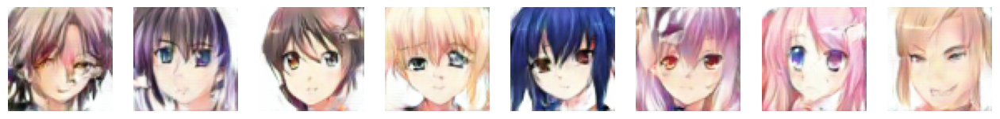

Epoch [24/50] - D Loss: 0.38092830777168274, G Loss: 2.4612460136413574


Epoch 25/50: 100%|██████████| 782/782 [00:38<00:00, 20.32it/s]


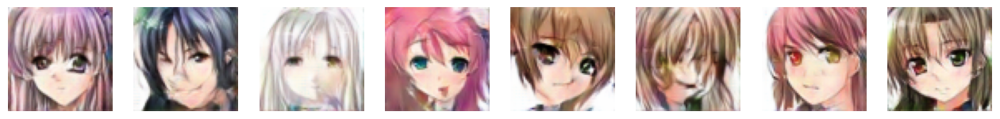

Epoch [25/50] - D Loss: 0.3775380849838257, G Loss: 2.49489688873291


Epoch 26/50: 100%|██████████| 782/782 [00:38<00:00, 20.27it/s]


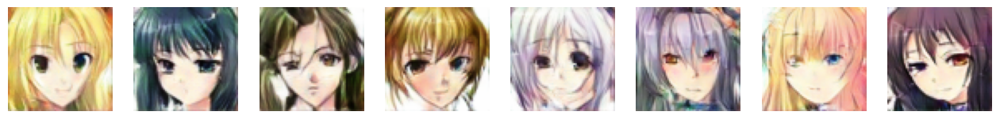

Epoch [26/50] - D Loss: 0.37411898374557495, G Loss: 2.5286221504211426


Epoch 27/50: 100%|██████████| 782/782 [00:38<00:00, 20.41it/s]


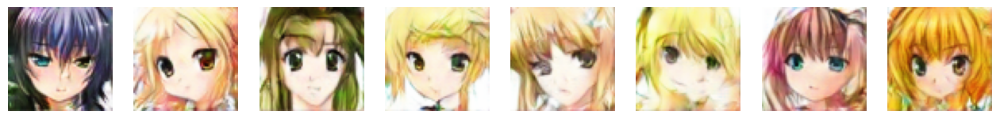

Epoch [27/50] - D Loss: 0.3715403079986572, G Loss: 2.559109687805176


Epoch 28/50: 100%|██████████| 782/782 [00:38<00:00, 20.41it/s]


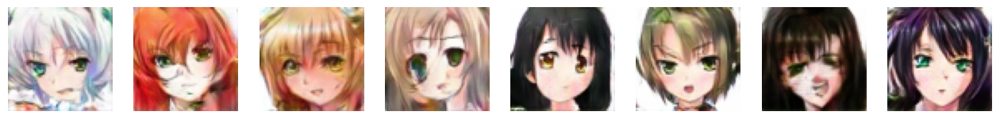

Epoch [28/50] - D Loss: 0.3682447373867035, G Loss: 2.591142177581787


Epoch 29/50: 100%|██████████| 782/782 [00:38<00:00, 20.41it/s]


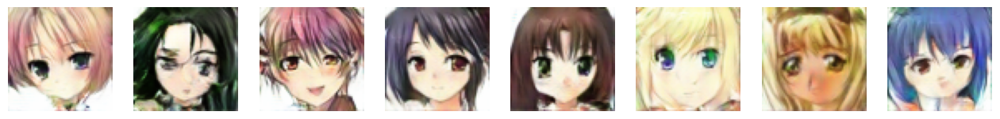

Epoch [29/50] - D Loss: 0.3650524914264679, G Loss: 2.624338388442993


Epoch 30/50: 100%|██████████| 782/782 [00:38<00:00, 20.44it/s]


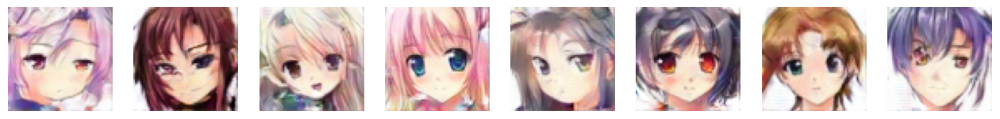

Epoch [30/50] - D Loss: 0.36203834414482117, G Loss: 2.656841993331909


Epoch 31/50: 100%|██████████| 782/782 [00:38<00:00, 20.38it/s]


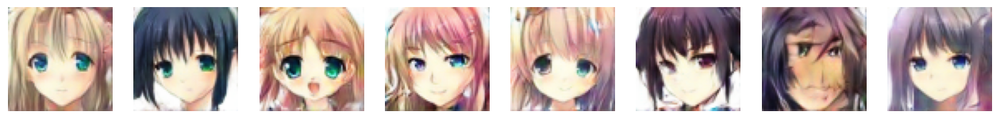

Epoch [31/50] - D Loss: 0.35903024673461914, G Loss: 2.6896047592163086


Epoch 32/50: 100%|██████████| 782/782 [00:38<00:00, 20.43it/s]


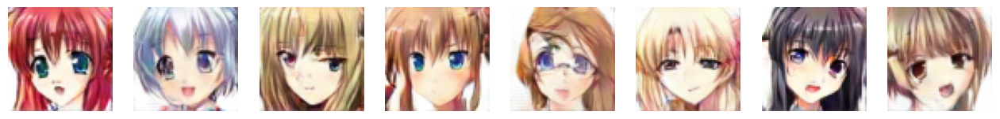

Epoch [32/50] - D Loss: 0.3560672104358673, G Loss: 2.722532033920288


Epoch 33/50: 100%|██████████| 782/782 [00:38<00:00, 20.36it/s]


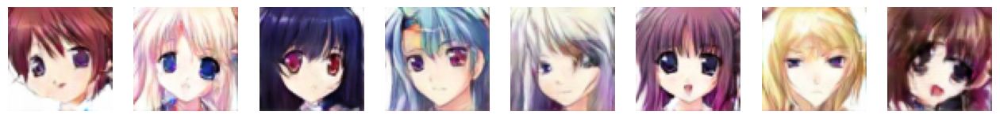

Epoch [33/50] - D Loss: 0.3532031178474426, G Loss: 2.755561590194702


Epoch 34/50: 100%|██████████| 782/782 [00:38<00:00, 20.45it/s]


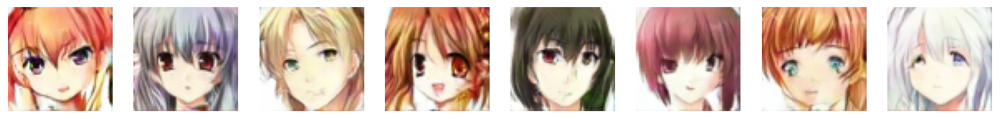

Epoch [34/50] - D Loss: 0.3503067195415497, G Loss: 2.789205551147461


Epoch 35/50: 100%|██████████| 782/782 [00:38<00:00, 20.45it/s]


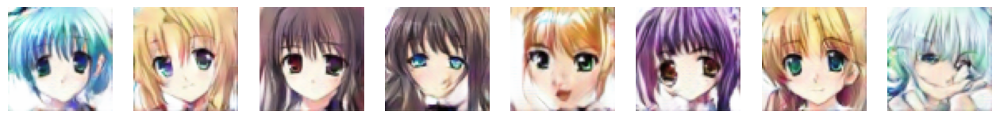

Epoch [35/50] - D Loss: 0.34750521183013916, G Loss: 2.8229503631591797


Epoch 36/50: 100%|██████████| 782/782 [00:38<00:00, 20.46it/s]


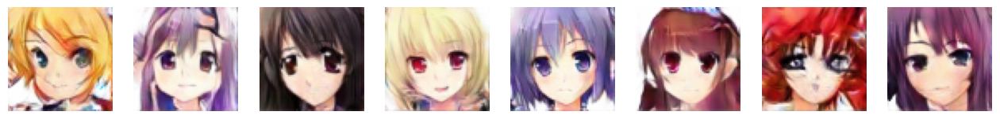

Epoch [36/50] - D Loss: 0.344804584980011, G Loss: 2.855409860610962


Epoch 37/50: 100%|██████████| 782/782 [00:38<00:00, 20.41it/s]


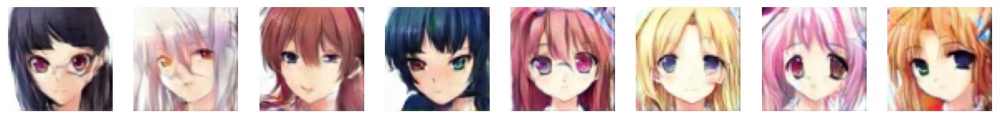

Epoch [37/50] - D Loss: 0.342096745967865, G Loss: 2.888516426086426


Epoch 38/50: 100%|██████████| 782/782 [00:38<00:00, 20.43it/s]


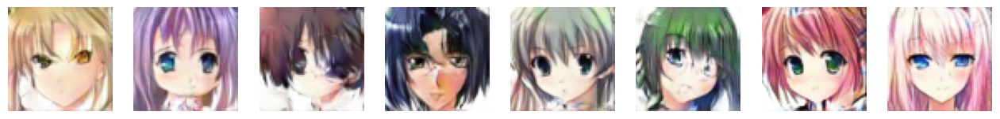

Epoch [38/50] - D Loss: 0.3394469916820526, G Loss: 2.921649217605591


Epoch 39/50: 100%|██████████| 782/782 [00:38<00:00, 20.45it/s]


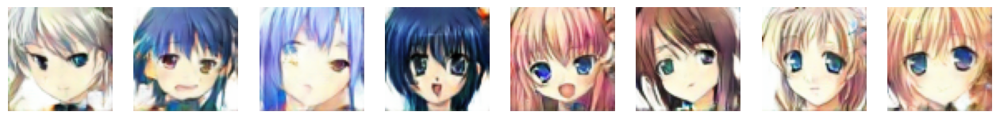

Epoch [39/50] - D Loss: 0.3368842601776123, G Loss: 2.9543609619140625


Epoch 40/50: 100%|██████████| 782/782 [00:38<00:00, 20.45it/s]


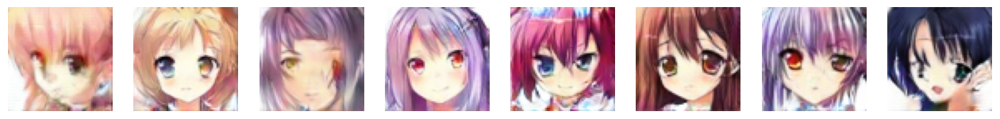

Epoch [40/50] - D Loss: 0.3343321979045868, G Loss: 2.9871950149536133


Epoch 41/50: 100%|██████████| 782/782 [00:38<00:00, 20.44it/s]


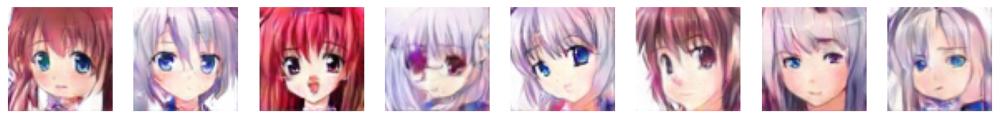

Epoch [41/50] - D Loss: 0.33185848593711853, G Loss: 3.019803762435913


Epoch 42/50: 100%|██████████| 782/782 [00:38<00:00, 20.38it/s]


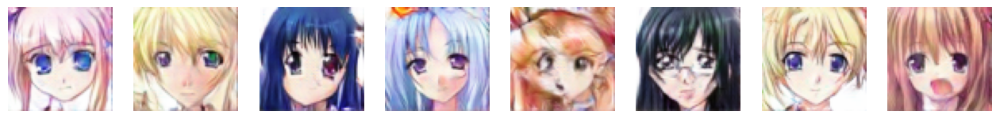

Epoch [42/50] - D Loss: 0.3294623792171478, G Loss: 3.0523550510406494


Epoch 43/50: 100%|██████████| 782/782 [00:38<00:00, 20.47it/s]


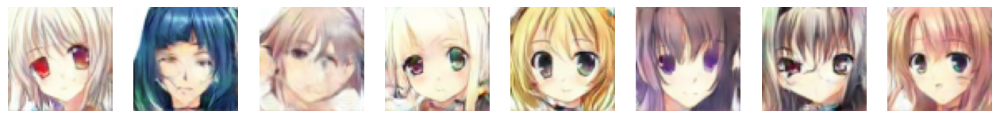

Epoch [43/50] - D Loss: 0.32706841826438904, G Loss: 3.084432601928711


Epoch 44/50: 100%|██████████| 782/782 [00:38<00:00, 20.21it/s]


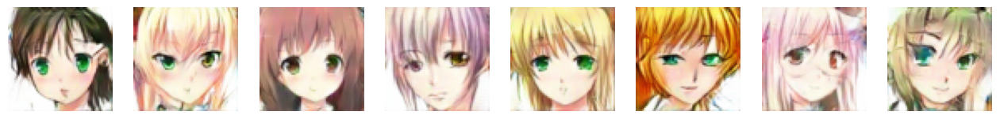

Epoch [44/50] - D Loss: 0.32479193806648254, G Loss: 3.116447925567627


Epoch 45/50: 100%|██████████| 782/782 [00:38<00:00, 20.16it/s]


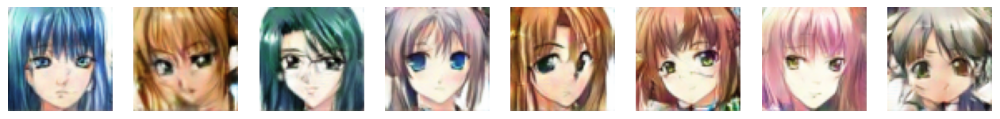

Epoch [45/50] - D Loss: 0.32255062460899353, G Loss: 3.1478211879730225


Epoch 46/50: 100%|██████████| 782/782 [00:38<00:00, 20.09it/s]


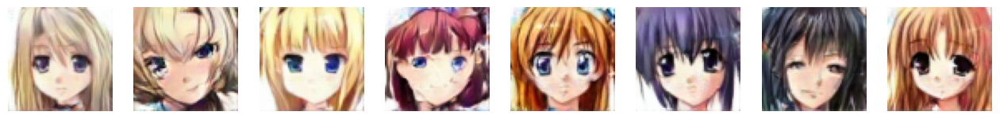

Epoch [46/50] - D Loss: 0.32032349705696106, G Loss: 3.178687572479248


Epoch 47/50: 100%|██████████| 782/782 [00:38<00:00, 20.29it/s]


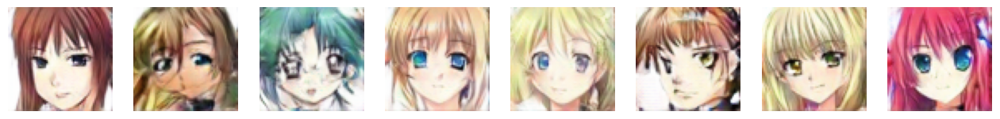

Epoch [47/50] - D Loss: 0.3182021677494049, G Loss: 3.209165096282959


Epoch 48/50: 100%|██████████| 782/782 [00:38<00:00, 20.37it/s]


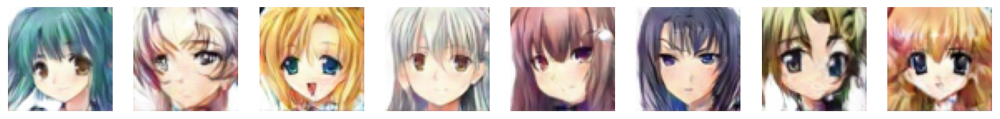

Epoch [48/50] - D Loss: 0.3160882592201233, G Loss: 3.2396318912506104


Epoch 49/50: 100%|██████████| 782/782 [00:38<00:00, 20.12it/s]


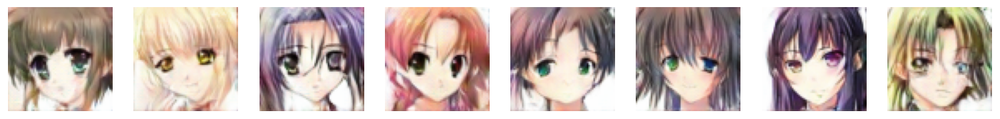

Epoch [49/50] - D Loss: 0.3140322268009186, G Loss: 3.2694854736328125


Epoch 50/50: 100%|██████████| 782/782 [00:38<00:00, 20.13it/s]


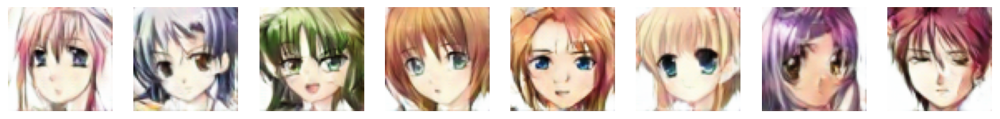

Epoch [50/50] - D Loss: 0.3120158612728119, G Loss: 3.299011468887329


Epoch 51/50: 100%|██████████| 782/782 [00:38<00:00, 20.20it/s]


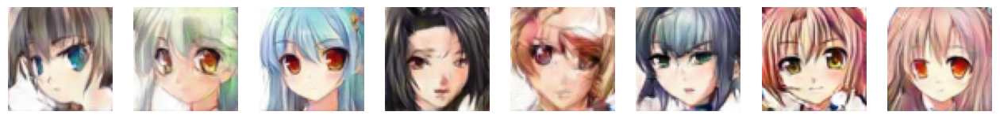

Epoch [51/50] - D Loss: 0.3099757134914398, G Loss: 3.329279899597168


Epoch 52/50: 100%|██████████| 782/782 [00:38<00:00, 20.45it/s]


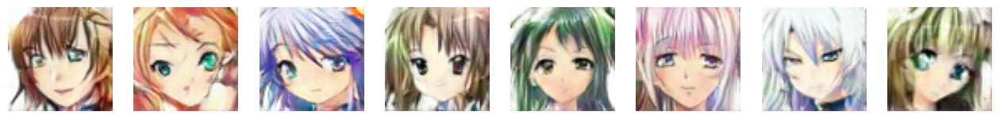

Epoch [52/50] - D Loss: 0.307976633310318, G Loss: 3.359243154525757


Epoch 53/50: 100%|██████████| 782/782 [00:38<00:00, 20.43it/s]


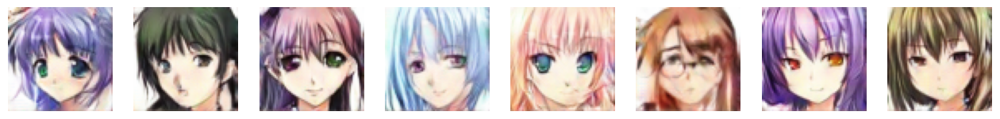

Epoch [53/50] - D Loss: 0.30607208609580994, G Loss: 3.3884944915771484


Epoch 54/50: 100%|██████████| 782/782 [00:38<00:00, 20.45it/s]


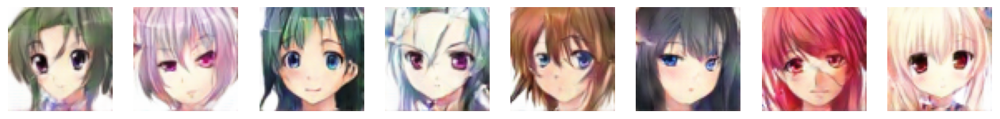

Epoch [54/50] - D Loss: 0.30420365929603577, G Loss: 3.4174351692199707


Epoch 55/50: 100%|██████████| 782/782 [00:38<00:00, 20.46it/s]


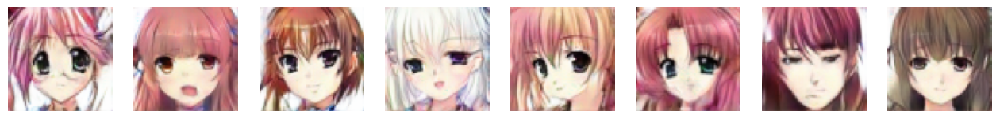

Epoch [55/50] - D Loss: 0.30235880613327026, G Loss: 3.4458494186401367


In [33]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  


def generate(model, num_images = 8, latent_dim = 300):
    plt.figure(figsize=(16, 2))  

    dcgan.generator.to(device)
    dcgan.generator.eval()
    
    for i in range(num_images):
        plt.subplot(1, num_images, i + 1) 
    
        noise = torch.randn(1, latent_dim, device=device)  
        
        with torch.no_grad():
            generated_image = dcgan.generator(noise)
    
        generated_image = generated_image.squeeze().cpu().detach()  
        generated_image = (generated_image*1) * 255
        
        image = Image.fromarray(np.uint8(generated_image.permute(1, 2, 0).numpy()))
        
        plt.imshow(image)
        plt.axis('off')
    
    plt.show()

epochs = 50
for epoch in range(epochs):
    dcgan.generator.train()
    dcgan.discriminator.train()
    
    d_loss_total = 0.0
    g_loss_total = 0.0
    
    # Training over batches
    for real_images in tqdm(dataloader, desc=f'Epoch {epoch + 1 + 5}/{epochs}'):
        real_images = real_images.to(device)  
        
        # Perform a single training step
        losses = dcgan.train_step(real_images)
        d_loss_total += losses['d_loss']
        g_loss_total += losses['g_loss']
    generate(dcgan)
    # Print average losses for the epoch
    print(f"Epoch [{epoch+1+5}/{epochs}] - D Loss: {d_loss_total / len(dataloader)}, G Loss: {g_loss_total / len(dataloader)}")

# Save the models after training
torch.save(dcgan.generator.state_dict(), 'generator.pth')
torch.save(dcgan.discriminator.state_dict(), 'discriminator.pth')


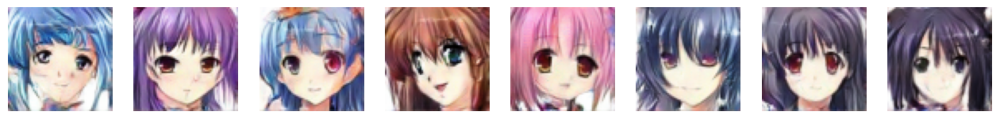

In [34]:
generate(dcgan)